# Import Data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, timedelta
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)
from sklearn import preprocessing# 

In [63]:
# Impor fungsi-fungsi dari scikit-learn (sklearn)
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_validate, cross_val_score
from sklearn.metrics import r2_score, mean_squared_error, accuracy_score, f1_score, precision_score, recall_score, roc_auc_score
from sklearn.metrics import make_scorer, confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

## Reading the Dataset

In [2]:
df = pd.read_csv('weatherAUS.csv')

In [3]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
145459,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


In [5]:
#mengidentifikasi nilai yang hilang serta tipe data dalam DataFrame.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

Dataset tersebut memiliki 22 column, 7 tipe data object atau string dan 15 tipe data float64 

In [6]:
#mengidentikasi baris dan kolom pada dataset
df.shape

(145460, 23)

Memiliki 145460 baris dan 23 kolom

In [7]:
#mengidentifikasi dan menghitung duplikat pada dataset
df.duplicated().sum()

0

In [8]:
#Mengelompok data sesuai kelompoknya
category = ['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']
numerical = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']

In [9]:
#Mengubah tipe data string menjadi category
df['Date'] = df['Date'].astype('category')
df['Location'] = df['Location'].astype('category')
df['WindGustDir'] = df['WindGustDir'].astype('category')
df['WindDir9am'] = df['WindDir9am'].astype('category')
df['WindDir3pm'] = df['WindDir3pm'].astype('category')
df['RainToday'] = df['RainToday'].astype('category')
df['RainTomorrow'] = df['RainTomorrow'].astype('category')
df.dtypes

Date             category
Location         category
MinTemp           float64
MaxTemp           float64
Rainfall          float64
Evaporation       float64
Sunshine          float64
WindGustDir      category
WindGustSpeed     float64
WindDir9am       category
WindDir3pm       category
WindSpeed9am      float64
WindSpeed3pm      float64
Humidity9am       float64
Humidity3pm       float64
Pressure9am       float64
Pressure3pm       float64
Cloud9am          float64
Cloud3pm          float64
Temp9am           float64
Temp3pm           float64
RainToday        category
RainTomorrow     category
dtype: object

In [10]:
#Check kelompok numerik
df_num = df.select_dtypes(include = ['float64'])
df_num.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,13.4,22.9,0.6,NaN,NaN,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8
1,7.4,25.1,0.0,NaN,NaN,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3
2,12.9,25.7,0.0,NaN,NaN,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2
3,9.2,28.0,0.0,NaN,NaN,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5
4,17.5,32.3,1.0,NaN,NaN,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7


In [11]:
#Check kelompok category
df_cat = df.select_dtypes(include = ['category'])
df_cat.head()

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,W,W,WNW,No,No
1,2008-12-02,Albury,WNW,NNW,WSW,No,No
2,2008-12-03,Albury,WSW,W,WSW,No,No
3,2008-12-04,Albury,NE,SE,E,No,No
4,2008-12-05,Albury,W,ENE,NW,No,No


In [12]:
# Mengidentifikasi jumlah entri (count), rata-rata (mean), standar deviasi (std), nilai minimum, kuartil pertama (25%), median (50%), kuartil ketiga (75%), dan nilai maksimum.
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


## Missing Values

In [13]:
# Mengidentifikasi jumlah nilai yang hilang (missing values) 
df_mv = pd.DataFrame(df.isna().sum()).reset_index()

In [14]:
df_mv.columns = ['Features','Missing Values']
df_mv

,Features,Missing Values
0,Date,0
1,Location,0
2,MinTemp,1485
3,MaxTemp,1261
4,Rainfall,3261
5,Evaporation,62790
6,Sunshine,69835
7,WindGustDir,10326
8,WindGustSpeed,10263
9,WindDir9am,10566


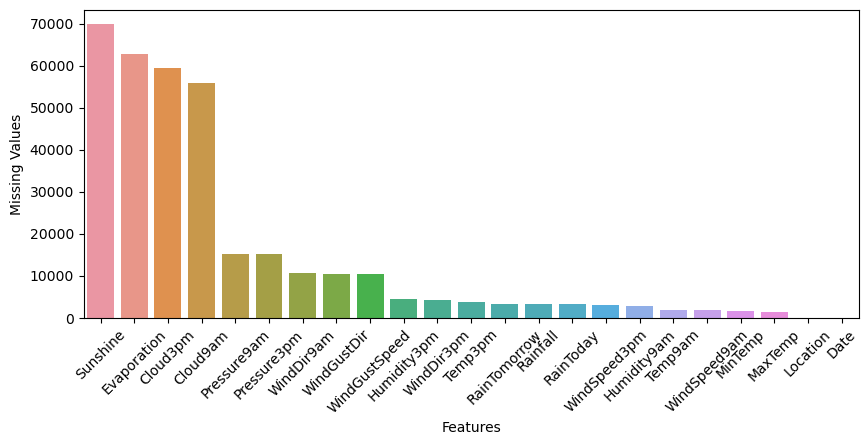

In [15]:
# Melihat jumlah nilai yang hilang (missing values) melalui bar plot
fig, ax = plt.subplots(1,1,figsize=(10,4))
sns.barplot(data = df_mv.sort_values(by='Missing Values', ascending=False), x='Features', y='Missing Values',ax=ax)

ax.tick_params(axis='x', labelrotation=45)

<Axes: >

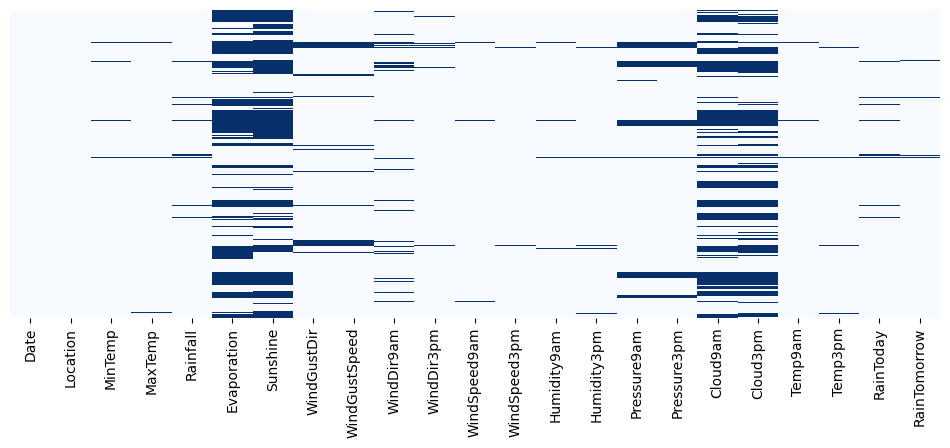

In [16]:
fig,ax = plt.subplots(1,1,figsize=(12,4))
sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='Blues', ax=ax)

Heatmap akan memvisualisasikan setiap sel dalam DataFrame yang terdapat nilai yang hilang

## Visualisasi Missing Values

<Axes: >

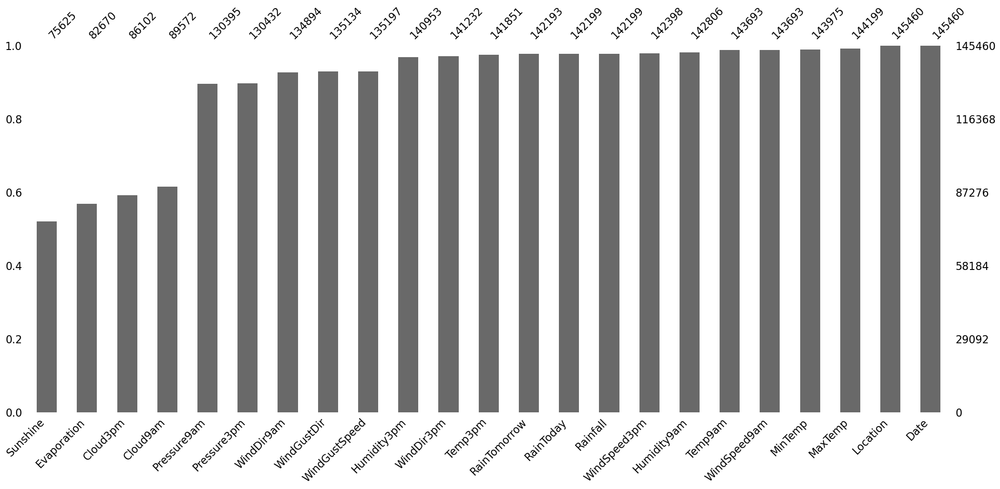

In [19]:
import missingno as msno
msno.bar(df, sort='ascending')

Grafik di atas menunjukkan bahwa jumlah nilai yang hilang yaitu : Sunshine, Evaporation, Cloud3pm dan Cloud9am

In [20]:
# Mengubah nilai pada dua kolom DataFrame yaitu 'RainToday' dan 'RainTomorrow', dari string 'Yes' dan 'No' menjadi bilangan biner (1 untuk 'Yes' dan 0 untuk 'No')
df['RainTomorrow'] = df['RainTomorrow'].map({'Yes': 1, 'No': 0})
df['RainToday'] = df['RainToday'].map({'Yes': 1, 'No': 0})

print(df.RainToday)
print(df.RainTomorrow)

0         0
1         0
2         0
3         0
4         0
         ..
145455    0
145456    0
145457    0
145458    0
145459    0
Name: RainToday, Length: 145460, dtype: category
Categories (2, int64): [0, 1]
0           0
1           0
2           0
3           0
4           0
         ... 
145455      0
145456      0
145457      0
145458      0
145459    NaN
Name: RainTomorrow, Length: 145460, dtype: category
Categories (2, int64): [0, 1]


In [21]:
# Menghitung persentase dari jumlah nilai yang hilang (missing values) pada setiap kolom DataFrame 
(df.isnull().sum()/len(df))*100

Date              0.000000
Location          0.000000
MinTemp           1.020899
MaxTemp           0.866905
Rainfall          2.241853
Evaporation      43.166506
Sunshine         48.009762
WindGustDir       7.098859
WindGustSpeed     7.055548
WindDir9am        7.263853
WindDir3pm        2.906641
WindSpeed9am      1.214767
WindSpeed3pm      2.105046
Humidity9am       1.824557
Humidity3pm       3.098446
Pressure9am      10.356799
Pressure3pm      10.331363
Cloud9am         38.421559
Cloud3pm         40.807095
Temp9am           1.214767
Temp3pm           2.481094
RainToday         2.241853
RainTomorrow      2.245978
dtype: float64

In [22]:
# Imputasi dataset dengan menggunakan nilai rata-rata.
df['MinTemp']=df['MinTemp'].fillna(df['MinTemp'].mean())
df['MaxTemp']=df['MaxTemp'].fillna(df['MaxTemp'].mean())
df['Rainfall']=df['Rainfall'].fillna(df['Rainfall'].mean())
df['Evaporation']=df['Evaporation'].fillna(df['Evaporation'].mean())
df['Sunshine']=df['Sunshine'].fillna(df['Sunshine'].mean())
df['WindGustSpeed']=df['WindGustSpeed'].fillna(df['WindGustSpeed'].mean())
df['WindSpeed9am']=df['WindSpeed9am'].fillna(df['WindSpeed9am'].mean())
df['WindSpeed3pm']=df['WindSpeed3pm'].fillna(df['WindSpeed3pm'].mean())
df['Humidity9am']=df['Humidity9am'].fillna(df['Humidity9am'].mean())
df['Humidity3pm']=df['Humidity3pm'].fillna(df['Humidity3pm'].mean())
df['Pressure9am']=df['Pressure9am'].fillna(df['Pressure9am'].mean())
df['Pressure3pm']=df['Pressure3pm'].fillna(df['Pressure3pm'].mean())
df['Cloud9am']=df['Cloud9am'].fillna(df['Cloud9am'].mean())
df['Cloud3pm']=df['Cloud3pm'].fillna(df['Cloud3pm'].mean())
df['Temp9am']=df['Temp9am'].fillna(df['Temp9am'].mean())
df['Temp3pm']=df['Temp3pm'].fillna(df['Temp3pm'].mean())

In [23]:
# Imputasi dataset dengan menggunakan mode
df['RainToday']=df['RainToday'].fillna(df['RainToday'].mode()[0])
df['RainTomorrow']=df['RainTomorrow'].fillna(df['RainTomorrow'].mode()[0])

In [24]:
# Imputasi dataset menggunakan mode
df['WindDir9am'] = df['WindDir9am'].fillna(df['WindDir9am'].mode()[0])
df['WindGustDir'] = df['WindGustDir'].fillna(df['WindGustDir'].mode()[0])
df['WindDir3pm'] = df['WindDir3pm'].fillna(df['WindDir3pm'].mode()[0])

In [25]:
(df.isnull().sum()/len(df))*100

Date             0.0
Location         0.0
MinTemp          0.0
MaxTemp          0.0
Rainfall         0.0
Evaporation      0.0
Sunshine         0.0
WindGustDir      0.0
WindGustSpeed    0.0
WindDir9am       0.0
WindDir3pm       0.0
WindSpeed9am     0.0
WindSpeed3pm     0.0
Humidity9am      0.0
Humidity3pm      0.0
Pressure9am      0.0
Pressure3pm      0.0
Cloud9am         0.0
Cloud3pm         0.0
Temp9am          0.0
Temp3pm          0.0
RainToday        0.0
RainTomorrow     0.0
dtype: float64

# Data Visualization

RainToday
0    113580
1     31880
Name: count, dtype: int64
RainTomorrow
0    113583
1     31877
Name: count, dtype: int64


<Axes: xlabel='RainTomorrow', ylabel='count'>

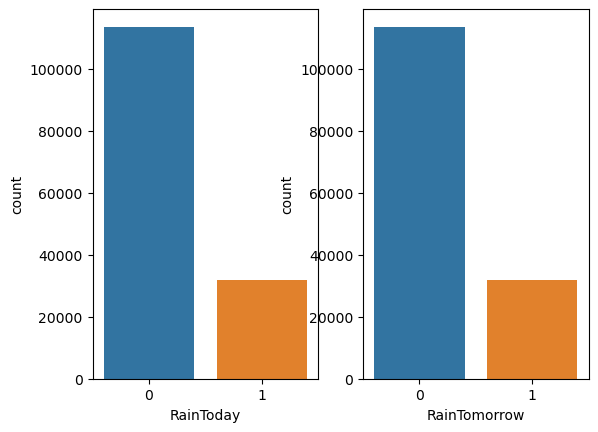

<Figure size 2000x3000 with 0 Axes>

In [26]:
# Mengidentifikasi jumlah hujan hari ini dan besok
fig, ax =plt.subplots(1,2)
print(df.RainToday.value_counts())
print(df.RainTomorrow.value_counts())

plt.figure(figsize=(20,30))
sns.countplot(data=df,x='RainToday',ax=ax[0])
sns.countplot(data=df,x='RainTomorrow',ax=ax[1])

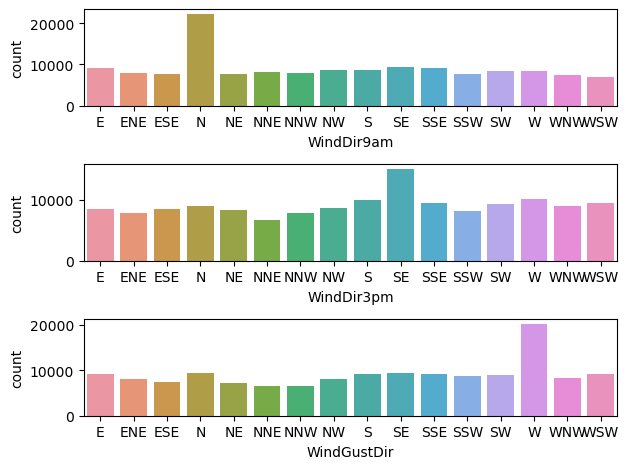

<Figure size 1000x1000 with 0 Axes>

In [27]:
# Mengidentifikasi arah angin jam 9 pagi, jam 3 sore
fig, ax =plt.subplots(3,1)
plt.figure(figsize=(10,10))

sns.countplot(data=df,x='WindDir9am',ax=ax[0])
sns.countplot(data=df,x='WindDir3pm',ax=ax[1])
sns.countplot(data=df,x='WindGustDir',ax=ax[2])
fig.tight_layout()

Pukul 9 pagi, paling tinggi yaitu arah N

Pukul 3 sore, paling tinggi yaitu arah SE

In [28]:
import plotly.express as px

In [29]:
print("Unique locations and their counts :")
location = df["Location"].value_counts()
location = location.reset_index()
location.columns= ["Location", "Counts"]
print(location)

Unique locations and their counts :
            Location  Counts
0           Canberra    3436
1             Sydney    3344
2           Adelaide    3193
3          Melbourne    3193
4              Perth    3193
5             Hobart    3193
6           Brisbane    3193
7             Darwin    3193
8             Albany    3040
9         Launceston    3040
10         GoldCoast    3040
11        Townsville    3040
12      MountGambier    3040
13            Cairns    3040
14           Bendigo    3040
15          Ballarat    3040
16        Wollongong    3040
17      AliceSprings    3040
18            Albury    3040
19       MountGinini    3040
20       Tuggeranong    3039
21           Penrith    3039
22         Newcastle    3039
23             Moree    3009
24              Sale    3009
25     BadgerysCreek    3009
26       Witchcliffe    3009
27       Williamtown    3009
28          Watsonia    3009
29        WaggaWagga    3009
30             Cobar    3009
31      CoffsHarbour    3009
32     

In [30]:
fig = px.treemap(location, path=['Location'], values='Counts', color='Counts', title="Tngkat hujan dari yang tertinggi ke terendah")
fig.show()

In [31]:
fig = px.histogram(df, x="Rainfall", title="Curah hujan (mm)", color_discrete_sequence=["blue"], nbins=25)
fig.show()

In [32]:
fig = px.histogram(df, x="Evaporation", title="Evaporation(mm)", color_discrete_sequence=["blue"])
fig.show()

In [33]:
print("Unique wind gust directions and their counts :")
windgustdir = df["WindGustDir"].value_counts()
windgustdir = windgustdir.reset_index()
windgustdir.columns= ["Wind Gust Direction", "Counts"]
print(windgustdir)

Unique wind gust directions and their counts :
   Wind Gust Direction  Counts
0                    W   20241
1                   SE    9418
2                    N    9313
3                  SSE    9216
4                    E    9181
5                    S    9168
6                  WSW    9069
7                   SW    8967
8                  SSW    8736
9                  WNW    8252
10                  NW    8122
11                 ENE    8104
12                 ESE    7372
13                  NE    7133
14                 NNW    6620
15                 NNE    6548


In [34]:
fig = px.bar(windgustdir, x="Wind Gust Direction", y="Counts", title="Arah hembusan angin berdasarkan yang tertinggi hingga terendah", color="Counts")
fig.show()

In [35]:
print("Unique wind gust speed in km/hr and their counts :")
windgustspd = df["WindGustSpeed"].value_counts()
windgustspd = windgustspd.reset_index()
windgustspd.columns= ["Wind Gust Speed", "Counts"]
print(windgustspd)

Unique wind gust speed in km/hr and their counts :
    Wind Gust Speed  Counts
0          40.03523   10263
1          35.00000    9215
2          39.00000    8794
3          31.00000    8428
4          37.00000    8047
..              ...     ...
63        122.00000       3
64        126.00000       2
65        124.00000       2
66        130.00000       1
67          6.00000       1

[68 rows x 2 columns]


In [36]:
fig = px.bar(windgustspd, x="Wind Gust Speed", y="Counts", title= "Kecepatan arah angin (Km/Jam) berdasarkan yang tertinggi Ke terendah", color="Counts")
fig.show()

In [37]:
loctemp = df.groupby("Location")[["MinTemp", "MaxTemp"]].mean().round()
loctemp = loctemp.reset_index()
loctemp.columns= ["Location","MinTemp", "MaxTemp"]
print(loctemp)

            Location  MinTemp  MaxTemp
0           Adelaide     13.0     23.0
1             Albany     13.0     20.0
2             Albury     10.0     23.0
3       AliceSprings     13.0     29.0
4      BadgerysCreek     11.0     24.0
5           Ballarat      7.0     18.0
6            Bendigo      9.0     22.0
7           Brisbane     16.0     26.0
8             Cairns     21.0     30.0
9           Canberra      7.0     21.0
10             Cobar     13.0     26.0
11      CoffsHarbour     14.0     24.0
12          Dartmoor      9.0     20.0
13            Darwin     23.0     33.0
14         GoldCoast     17.0     26.0
15            Hobart      9.0     18.0
16         Katherine     20.0     35.0
17        Launceston      8.0     19.0
18         Melbourne     12.0     21.0
19  MelbourneAirport     10.0     20.0
20           Mildura     11.0     25.0
21             Moree     13.0     27.0
22      MountGambier      9.0     20.0
23       MountGinini      4.0     12.0
24         Newcastle     

In [38]:
fig = px.bar(loctemp, x="Location", y=["MinTemp", "MaxTemp"], title="Lokasi hujan berdasarkan rata-rata suhu minimum rata-rata dan suhu maksimum")
fig.show()

In [39]:
fig = px.histogram(df, x='Location', title='RainToday', color='RainToday')
fig.show()

In [40]:
fig = px.histogram(df, x='Location', title='Rain Tomorrow', color='RainTomorrow')
fig.show()

In [41]:
from IPython.core.display import display, HTML
display(HTML("<div class='tableauPlaceholder' id='viz1652712003286' style='position: relative'><noscript><a href='#'><img alt='RainFall Per Location ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Ra&#47;RainFallinLocations&#47;Sheet1&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='site_root' value='' /><param name='name' value='RainFallinLocations&#47;Sheet1' /><param name='tabs' value='no' /><param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Ra&#47;RainFallinLocations&#47;Sheet1&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='en-US' /><param name='filter' value='publish=yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1652712003286');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';var scriptElement = document.createElement('script');scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js'; vizElement.parentNode.insertBefore(scriptElement, vizElement); </script>"))

/var/folders/v5/87yl3yfj69j7yrypnbp8ghzm0000gp/T/ipykernel_2754/832404541.py:1: DeprecationWarning:

Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display



## Jumlah rata-rata curah hujan untuk setiap kota di Australia dan frekuensi setiap curah hujan

In [42]:
df['Date'] = pd.to_datetime(df['Date'])

In [43]:
df['Year'] = df['Date'].dt.year
df['Year'].head()

0    2008
1    2008
2    2008
3    2008
4    2008
Name: Year, dtype: int32

In [44]:
df['Month'] = df['Date'].dt.month
df['Month'].head()

0    12
1    12
2    12
3    12
4    12
Name: Month, dtype: int32

In [45]:
df['Day'] = df['Date'].dt.day
df['Day'].head()

0    1
1    2
2    3
3    4
4    5
Name: Day, dtype: int32

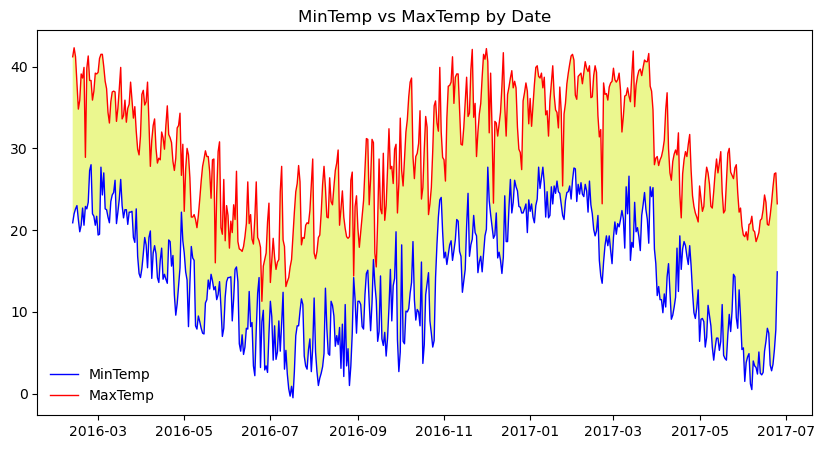

In [46]:
# Decision Tree Classifier

## Data Preprocessingdf_date = df.iloc[-500:,:]
plt.figure(figsize=[10,5])
plt.plot(df_date['Date'],df_date['MinTemp'],color='blue',linewidth=1, label= 'MinTemp')
plt.plot(df_date['Date'],df_date['MaxTemp'],color='red',linewidth=1, label= 'MaxTemp')
plt.fill_between(df_date['Date'],df_date['MinTemp'],df_date['MaxTemp'], facecolor = '#EBF78F')
plt.title('MinTemp vs MaxTemp by Date')
plt.legend(loc='lower left', frameon=False)
plt.show()

# Decision Tree Classifier

## Data Preprocessing

In [47]:
df_model = df.copy()

In [49]:
category = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm']
boolean = ['RainTomorrow']

In [50]:
le = preprocessing.LabelEncoder()

# Mengubah data kategori ke data numerik pada DataFrame df
for col in category:
    df_model[col] = le.fit_transform(df_model[col])

# Mengubah data boolean ke data numerik pada DataFrame df
for col in boolean:
    df_model[col] = le.fit_transform(df_model[col])

In [51]:
df_model.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,2008-12-01,2,13.4,22.9,0.6,5.468232,7.611178,13,44.0,13,...,1007.1,8.000000,4.50993,16.9,21.8,0,0,2008,12,1
1,2008-12-02,2,7.4,25.1,0.0,5.468232,7.611178,14,44.0,6,...,1007.8,4.447461,4.50993,17.2,24.3,0,0,2008,12,2
2,2008-12-03,2,12.9,25.7,0.0,5.468232,7.611178,15,46.0,13,...,1008.7,4.447461,2.00000,21.0,23.2,0,0,2008,12,3
3,2008-12-04,2,9.2,28.0,0.0,5.468232,7.611178,4,24.0,9,...,1012.8,4.447461,4.50993,18.1,26.5,0,0,2008,12,4
4,2008-12-05,2,17.5,32.3,1.0,5.468232,7.611178,13,41.0,1,...,1006.0,7.000000,8.00000,17.8,29.7,0,0,2008,12,5


## Mencari Korelasi

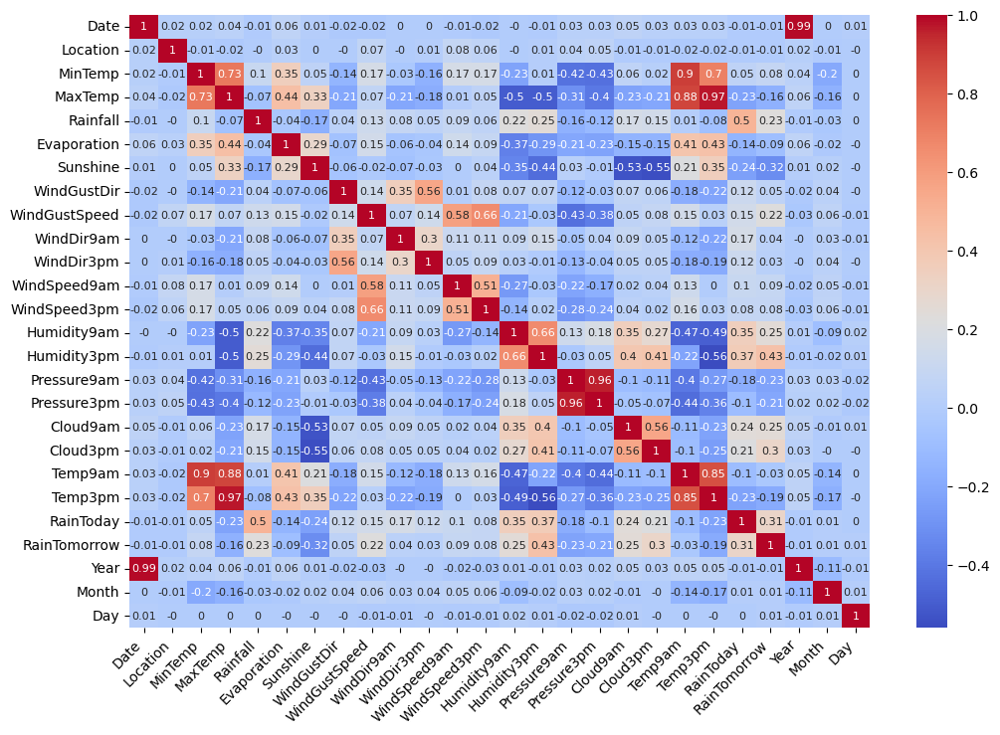

In [54]:
plt.figure(figsize=(12, 8))
sns.heatmap(df_model.corr().round(2), annot=True, cmap='coolwarm', 
            xticklabels=df_model.corr().columns, 
            yticklabels=df_model.corr().columns, 
            annot_kws={"size": 8})
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.show()

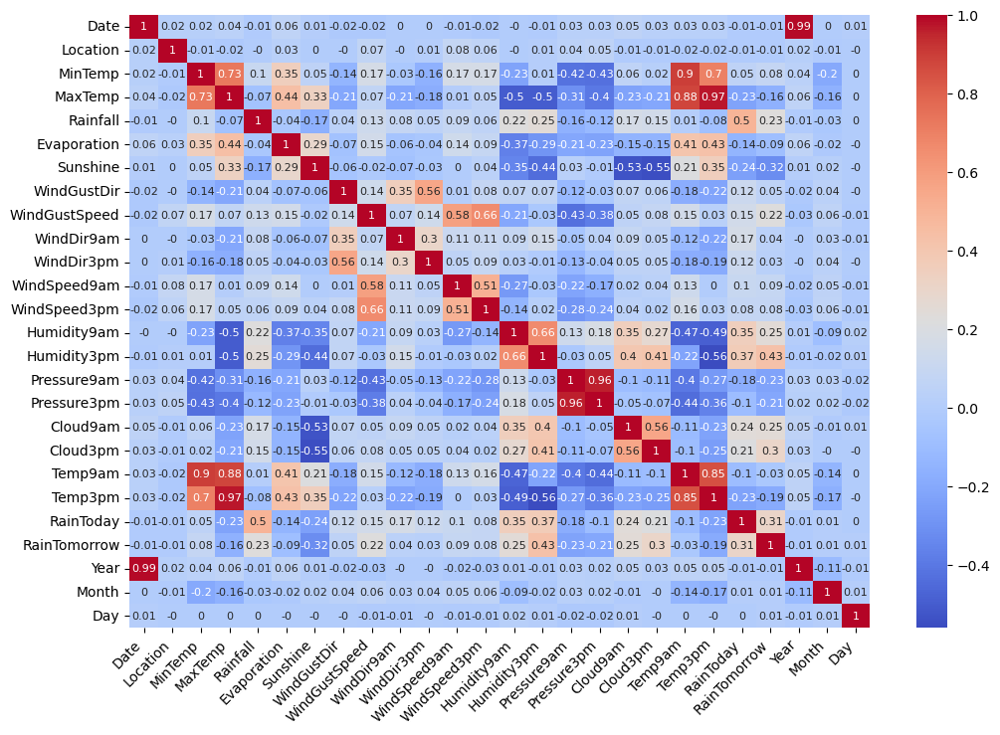

In [56]:
plt.figure(figsize=(12, 8))
sns.heatmap(df_model.corr().round(2), annot=True, cmap='coolwarm', 
            xticklabels=df_model.corr().columns, 
            yticklabels=df_model.corr().columns, 
            annot_kws={"size": 8})
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.show()

Dikarenakan Year merupakan dt dari Date yang berupa timestamp, maka Date tidak digunakan

In [58]:
df_model[['Temp3pm','MaxTemp']]

,Temp3pm,MaxTemp
0,21.8,22.900000
1,24.3,25.100000
2,23.2,25.700000
3,26.5,28.000000
4,29.7,32.300000
...,...,...
145455,22.4,23.400000
145456,24.5,25.300000
145457,26.1,26.900000
145458,26.0,27.000000


Korelasi 'Temp3pm' dan 'MaxTemp' hampir bernilai 1 (0.97), setelah di analisa sepertinya memang puncak Temp berada di sekitar jam 3pm, sepertinya ini adalah dua dataset yang memang mempunyai nilai terpisah. maka sepertinya data yang dipakai hanya MaxTemp

In [59]:
df_model.shape

(145460, 26)

In [60]:
# Pilih kolom-kolom yang akan dijadikan fitur
feature_cols = [
'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am','RainToday','Month', 'Day','Year'
]

# Pilih kolom target yang akan diprediksi
target_col = ['RainTomorrow']

### Spliting Data menjadi 80% untuk training dan 20% untuk testing

In [61]:
X = df_model[feature_cols]
y = df_model[target_col]
split_test_size = 0.20

In [64]:
X_train, X_test, y_train, y_test = train_test_split(X, y , test_size=split_test_size, random_state=100)

### Train Model

In [65]:
from sklearn.tree import DecisionTreeClassifier
Dtc = DecisionTreeClassifier(criterion='entropy', max_depth=9)
Dtc = Dtc.fit(X_train, y_train)
y_pred = Dtc.predict(X_test)

In [66]:
# Evaluasi model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification Report:\n", classification_rep)

Accuracy:  0.8386154269214905
Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.95      0.90     22648
           1       0.71      0.46      0.56      6444

    accuracy                           0.84     29092
   macro avg       0.78      0.70      0.73     29092
weighted avg       0.83      0.84      0.83     29092



### Confusion Matrix

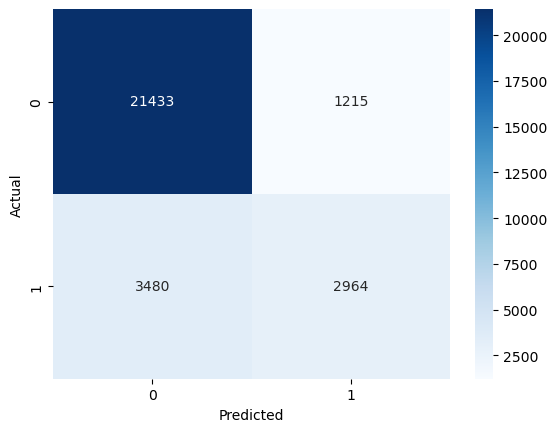

In [68]:
# Prediksi menggunakan model Decision Tree Classifier
predictions = Dtc.predict(X_test)

# Menghitung confusion matrix
cm = confusion_matrix(y_test, predictions, labels=Dtc.classes_)

# Menampilkan confusion matrix dengan format angka tanpa eksponensial menggunakan heatmap
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=Dtc.classes_, yticklabels=Dtc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

- True Negatives (TN): 21433
Kasus yang benar-benar diprediksi sebagai negatif.


- False Positives (FN): 1215
Kasus yang salah diprediksi sebagai positif. Model melakukan kesalahan dengan memprediksi sesuatu sebagai positif padahal seharusnya negatif.


- False Negatives (FP): 3480
Kasus yang salah diprediksi sebagai negatif. Model melakukan kesalahan dengan memprediksi sesuatu sebagai negatif padahal seharusnya positif.


- True Positives (TP): 2964
Kasus yang benar-benar diprediksi sebagai positif.

## Melihat hasil prediksi di dataframe

In [69]:
# Membuat DataFrame untuk hasil prediksi
result_df = X_test.copy()
result_df['Actual'] = y_test
result_df['Predicted'] = y_pred

result_df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir3pm,WindSpeed9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday,Month,Day,Year,Actual,Predicted
81285,12,8.8,14.2,13.800000,1.800000,8.900000,15,70.0,15,22.0,...,1011.500000,4.447461,4.50993,9.4,1,10,15,2009,1,1
119470,32,14.6,25.6,0.000000,6.200000,8.700000,12,37.0,13,9.0,...,1020.800000,1.000000,1.00000,21.3,0,4,15,2014,0,0
131117,15,8.9,15.4,29.800000,11.400000,0.000000,11,70.0,11,26.0,...,1015.200000,4.447461,4.50993,10.6,1,1,31,2012,0,1
106459,48,8.0,16.6,0.000000,2.000000,1.100000,7,33.0,11,17.0,...,1020.100000,7.000000,7.00000,9.9,0,7,17,2011,0,0
52818,23,5.8,15.1,0.600000,5.468232,7.611178,12,56.0,15,13.0,...,1015.255889,4.447461,4.50993,9.3,0,12,27,2010,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
137336,3,0.7,19.1,0.000000,4.000000,10.100000,2,33.0,2,0.0,...,1024.900000,0.000000,0.00000,9.2,0,6,18,2012,0,0
99027,0,14.7,24.9,0.000000,5.468232,7.611178,12,37.0,15,9.0,...,1021.400000,4.447461,4.50993,19.8,0,2,26,2016,0,0
137875,3,19.0,35.9,0.000000,9.400000,12.000000,2,65.0,2,20.0,...,1002.700000,1.000000,1.00000,29.0,0,2,6,2014,0,0
128941,43,11.8,26.1,2.360918,5.468232,7.611178,9,44.0,9,17.0,...,1011.600000,4.447461,4.50993,20.5,0,1,11,2015,0,0


In [70]:
result_df['Predicted'].value_counts()

Predicted
0    24913
1     4179
Name: count, dtype: int64

In [71]:
result_true = result_df[result_df['Predicted'] == 1]

In [72]:
result_true.head(20)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir3pm,WindSpeed9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday,Month,Day,Year,Actual,Predicted
81285,12,8.8,14.2,13.8,1.800000,8.900000,15,70.0,15,22.0,...,1011.500000,4.447461,4.50993,9.4,1,10,15,2009,1,1
131117,15,8.9,15.4,29.8,11.400000,0.000000,11,70.0,11,26.0,...,1015.200000,4.447461,4.50993,10.6,1,1,31,2012,0,1
81150,12,9.9,15.6,6.8,1.200000,0.600000,2,37.0,0,11.0,...,1025.300000,4.447461,4.50993,11.0,1,6,2,2009,0,1
130365,15,13.0,22.7,0.2,5.100000,2.100000,7,63.0,7,22.0,...,1000.400000,7.000000,7.00000,16.8,0,12,10,2009,1,1
22342,27,15.0,18.2,8.4,4.800000,0.100000,9,50.0,10,13.0,...,1006.000000,8.000000,6.00000,15.9,1,6,7,2012,1,1
132177,15,21.4,27.4,2.6,8.400000,0.200000,7,56.0,12,15.0,...,1011.000000,6.000000,7.00000,25.2,1,2,23,2015,1,1
121012,31,10.8,17.8,16.4,1.600000,4.900000,15,52.0,12,9.0,...,1008.900000,6.000000,7.00000,12.6,1,7,10,2009,1,1
89499,8,22.0,27.3,1.8,3.600000,2.700000,10,35.0,9,17.0,...,1012.700000,7.000000,7.00000,23.1,1,6,16,2015,0,1
11283,11,16.6,23.5,0.2,5.468232,7.611178,8,30.0,8,15.0,...,1012.300000,8.000000,8.00000,21.0,0,5,4,2015,0,1
60288,6,17.3,24.0,11.2,5.468232,7.611178,15,50.0,12,24.0,...,1003.300000,8.000000,8.00000,18.8,1,1,14,2015,0,1


### Conclusion
Model ini memiliki akurasi sekitar 84%, dan memiliki presisi yang cukup untuk mendeteksi hujan:1, dan tidak hujan:2. Akan tetapi jumlah false positif masih banyak.

# Random Forrest Classifier

### Spliting Data menjadi 80% untuk training dan 20% untuk testing

In [73]:
X = df_model[feature_cols]
y = df_model[target_col].values
split_test_size = 0.20

In [74]:
y = y.ravel()

### Train Model

In [80]:
X_train, X_test, y_train, y_test = train_test_split(X, y , test_size=split_test_size, random_state=42)

In [84]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=100)

In [85]:
rfc = rfc.fit(X_train, y_train)
y_pred = rfc.predict(X_test)

## Evaluasi Model

In [86]:
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification Report:\n", classification_rep)

Accuracy:  0.8531211329575141
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.96      0.91     22672
           1       0.76      0.49      0.60      6420

    accuracy                           0.85     29092
   macro avg       0.81      0.72      0.75     29092
weighted avg       0.84      0.85      0.84     29092



## Confusion Matrix

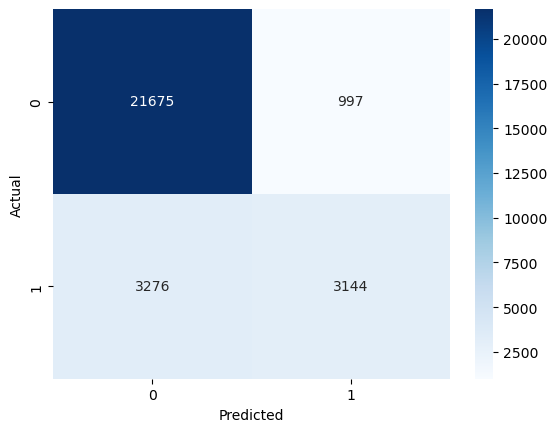

In [87]:
# Prediksi menggunakan model Decision Tree Classifier
predictions = rfc.predict(X_test)

# Menghitung confusion matrix
cm = confusion_matrix(y_test, predictions, labels=rfc.classes_)

# Menampilkan confusion matrix dengan format angka tanpa eksponensial menggunakan heatmap
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=rfc.classes_, yticklabels=rfc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


- **True Negatives (TN):** 21675
  - Menunjukkan bahwa 21675 dari sampel yang sebenarnya negatif berhasil diprediksi dengan benar.

- **False Positives (FP):** 3276
  - Mengindikasikan bahwa 3276 dari sampel yang sebenarnya negatif salah diprediksi sebagai positif.

- **False Negatives (FN):** 997
  - Menunjukkan bahwa 997 dari sampel yang sebenarnya positif salah diprediksi sebagai negatif.

- **True Positives (TP):** 3144
  - Menunjukkan bahwa 3144 dari sampel yang sebenarnya positif berhasil diprediksi dengan benar.

In [88]:
# Membuat DataFrame untuk hasil prediksi
result_df = X_test.copy()
result_df['Actual'] = y_test
result_df['Predicted'] = y_pred

result_df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir3pm,WindSpeed9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday,Month,Day,Year,Actual,Predicted
100721,22,15.0,18.9,4.200000,6.600000,8.000000,6,54.00000,7,24.0,...,1003.700000,4.000000,5.00000,17.3,1,4,22,2012,1,1
30234,37,13.1,26.8,0.000000,4.600000,10.900000,13,40.03523,14,22.0,...,1009.000000,0.000000,1.00000,16.9,0,3,30,2008,0,0
68427,18,19.0,29.0,2.360918,11.000000,5.600000,3,59.00000,3,39.0,...,1003.400000,4.447461,4.50993,24.2,0,12,10,2011,0,1
28624,34,18.1,32.2,0.000000,2.100000,7.611178,4,30.00000,4,0.0,...,1014.600000,4.447461,4.50993,20.9,0,3,27,2013,0,0
31173,37,13.9,19.6,14.000000,1.200000,5.400000,11,50.00000,8,17.0,...,1018.400000,7.000000,6.00000,15.5,1,10,25,2010,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57136,5,10.8,19.7,0.000000,5.468232,7.611178,3,43.00000,5,22.0,...,1013.700000,5.000000,8.00000,16.3,0,9,24,2014,1,0
30386,37,8.7,18.2,0.000000,4.200000,10.100000,13,40.03523,10,19.0,...,1022.300000,2.000000,4.00000,12.5,0,8,29,2008,0,0
17904,24,14.5,25.2,0.000000,5.468232,7.611178,13,40.03523,9,19.0,...,1015.255889,4.000000,4.50993,22.5,0,11,26,2016,0,0
128313,43,12.7,20.6,0.800000,5.468232,7.611178,14,31.00000,15,15.0,...,1020.400000,4.447461,4.50993,15.9,0,4,23,2013,0,1


In [89]:
result_df['Predicted'].value_counts()

Predicted
0    24951
1     4141
Name: count, dtype: int64

Model ini mampu memprediksi tidak hujan:0 lebih banyak dibandingkan Decission Tree Classifier, memprediksi hujan:1 lebih sedikit dibandingkan Decission Tree Classifier. Tetapi memiliki accuracy dan recall yang lebih baik dibandingkan Decission Tree

## Finding Important Features in Scikit-learn

In [90]:
feature_names = X.columns

In [91]:
feature_imp = pd.Series(rfc.feature_importances_, index=feature_names).sort_values(ascending=False)

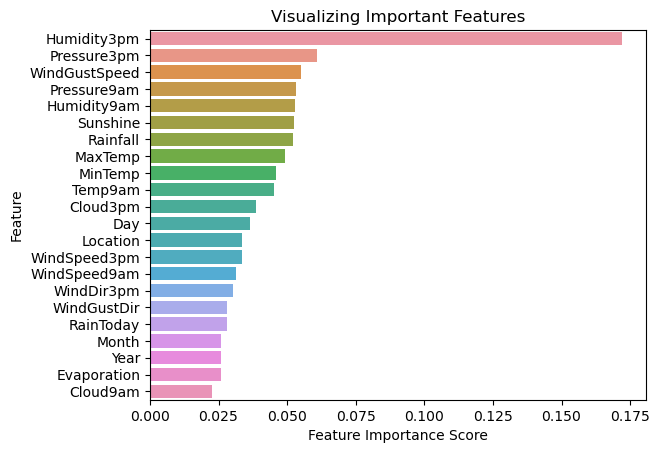

In [92]:
import seaborn as sns
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add Labels to graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Feature')
plt.title("Visualizing Important Features")
plt.show()

Dari plot diatas dapat membantu dalam memahami faktor-faktor yang paling berpengaruh dalam membuat prediksi model. Ini dapat memberikan wawasan tentang variabel mana yang memiliki dampak paling besar terhadap hasil prediksi. yang paling berpengaruh di model ini adalah Humidity, Humidity dalam cuaca merujuk pada sejauh mana udara terkandung dengan uap air atau kelembapan.